<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Reading-and-familiarizing-with-the-data" data-toc-modified-id="Reading-and-familiarizing-with-the-data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Reading and familiarizing with the data</a></span></li><li><span><a href="#Preprocessing" data-toc-modified-id="Preprocessing-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Preprocessing</a></span><ul class="toc-item"><li><span><a href="#ID,-Version,-Album_type" data-toc-modified-id="ID,-Version,-Album_type-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>ID, Version, Album_type</a></span></li><li><span><a href="#Artists" data-toc-modified-id="Artists-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Artists</a></span></li><li><span><a href="#Track" data-toc-modified-id="Track-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Track</a></span></li><li><span><a href="#Duration" data-toc-modified-id="Duration-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Duration</a></span></li><li><span><a href="#Artists_Genres" data-toc-modified-id="Artists_Genres-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Artists_Genres</a></span></li><li><span><a href="#Album" data-toc-modified-id="Album-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Album</a></span></li><li><span><a href="#Release_year" data-toc-modified-id="Release_year-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Release_year</a></span></li><li><span><a href="#Labels" data-toc-modified-id="Labels-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Labels</a></span></li><li><span><a href="#Key" data-toc-modified-id="Key-2.9"><span class="toc-item-num">2.9&nbsp;&nbsp;</span>Key</a></span></li><li><span><a href="#Vocal" data-toc-modified-id="Vocal-2.10"><span class="toc-item-num">2.10&nbsp;&nbsp;</span>Vocal</a></span></li><li><span><a href="#Country" data-toc-modified-id="Country-2.11"><span class="toc-item-num">2.11&nbsp;&nbsp;</span>Country</a></span></li><li><span><a href="#BPM,-Energy,-Dancebility,-Happiness" data-toc-modified-id="BPM,-Energy,-Dancebility,-Happiness-2.12"><span class="toc-item-num">2.12&nbsp;&nbsp;</span>BPM, Energy, Dancebility, Happiness</a></span></li></ul></li><li><span><a href="#Creating-models." data-toc-modified-id="Creating-models.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Creating models.</a></span><ul class="toc-item"><li><span><a href="#DecisionTree-Classifier" data-toc-modified-id="DecisionTree-Classifier-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>DecisionTree Classifier</a></span></li><li><span><a href="#RandomForestClassifier" data-toc-modified-id="RandomForestClassifier-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>RandomForestClassifier</a></span></li><li><span><a href="#SVM-Classifier" data-toc-modified-id="SVM-Classifier-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>SVM Classifier</a></span></li><li><span><a href="#KNeighbors-Classifier" data-toc-modified-id="KNeighbors-Classifier-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>KNeighbors Classifier</a></span></li><li><span><a href="#Logistic-Regression" data-toc-modified-id="Logistic-Regression-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Logistic Regression</a></span></li><li><span><a href="#CatBoostClassifier" data-toc-modified-id="CatBoostClassifier-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>CatBoostClassifier</a></span></li><li><span><a href="#Voting-Classifier-for-best-parameters" data-toc-modified-id="Voting-Classifier-for-best-parameters-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>Voting Classifier for best parameters</a></span></li></ul></li></ul></div>

# Musical preferences

This project involves creating a model to predict music preferences based on user listening history. The dataset includes various songs, and the task is to perform binary classification to determine whether the user likes 👍 a particular song or not 👎. The model aims to predict these preferences, providing insights into the user's musical taste.

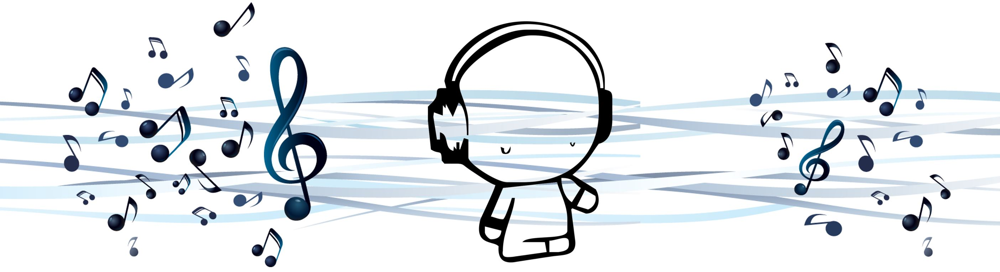

In [1]:
from IPython.display import Image
Image(filename='music_preferences.jpg')

In [144]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import yaml
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
import pandas_profiling as pp
from sklearn.preprocessing import LabelEncoder
import plotly.graph_objects as go

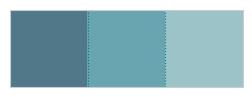

In [145]:
palette = ['#507889','#68a5b0','#9cc3c8']
sns.palplot(palette)

Let's create two functions:
- for converting data to the "one-hot encoding" format;
- building a cumulative chart based on "one-hot" data

In [146]:
# Функция для преобразования данных в формат one-hot encoding
def split_to_onehot(df, col):
    unique = []
    for i in df.index:
        unique.extend(df.loc[i,col].split("|"))
    if "" in unique:
        unique.remove("")
    unique = list(set(unique))
    
    onehot = df.loc[:,["Category"]]
    onehot[unique] = np.zeros((len(unique),), dtype = np.int8)
    for i in df.index:
        g = set(df.loc[i,col].split("|"))
        for j in g:
            if j!="":
                onehot.loc[i,j] = 1
    _a = onehot.groupby("Category").sum()
    only_one = list(_a.sum()[_a.sum()==1].index)
    only_train = list(_a.loc["none"][_a.loc["none"]==0].index)
    only_test = list(_a.loc[["like",'dislike']].sum()[_a.loc[["like",'dislike']].sum()==0].index)
    _a = set(only_one + only_train + only_test)
    onehot = onehot.drop(_a, axis=1)
    
    return onehot

# Функция для построения накопительной диаграммы по one-hot данным
def plot_commulative_onehot(onehot):
    _df = onehot.groupby("Category").sum()
    fig = go.Figure()
    for i in range(len(_df.index)):
        k = _df.index[i]
        x,y=[],[]
        for g in _df.columns:
            if _df.loc[k,g]!=0:
                x.append(g)
                y.append(_df.loc[k,g])
        fig.add_trace(go.Bar(x=x, y=y,name=k,marker=dict(color=palette[i])))
    fig.show()

## Reading and familiarizing with the data

In [147]:
# загрузим описание данных из файла YAML
description = yaml.load(open('Description.yaml', 'r'), Loader=yaml.FullLoader)

sample = pd.read_csv('sample_submition.csv')

# 'test.csv' содержит тестовые данные
test = pd.read_csv('test.csv')

# 'train.csv' содержит тренировочные данные
train = pd.read_csv('train.csv')

# объединеним тренировочный и тестовый наборы данных
df = pd.concat([train, test]).reset_index(drop=True)

# Создание маски, где тренировочные данные имеют ненулевые значения в столбце "Category"
tr_mask = ~df.Category.isna()

# Заполнение пропущенных значений в столбце "Category" значением 'none' 
# и замена значений 0 на 'dislike' и 1 на 'like'
df['Category'] = df['Category'].fillna('none').replace({0: 'dislike', 1: 'like'})

# посмотрим количество строк и столбцов)
df.shape


(965, 18)

In [148]:
df.head(3)

,Id,Category,Artists,Track,Version,Duration,Artists_Genres,Album,Release_year,Album_type,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness
0,0,dislike,Avatar,Hail the Apocalypse,NaN,253660,metal,Hail the Apocalypse,2014,NaN,Gain,F# Major,93,M,SWE,99.0,42.0,30.0
1,1,like,Céline Dion,My Heart Will Go On,Soundtrack,284150,soundtrack|classical|pop,My Love Ultimate Essential Collection,2019,NaN,Sony Music Entertainment Canada,E Major,99,F,CA,28.0,43.0,4.0
2,2,like,Adele,Skyfall,Soundtrack,286480,pop,Skyfall,2012,single,Melted Stone|Skyfall|Columbia,C Minor,76,F,GB,55.0,35.0,8.0


In [149]:
df.isnull().sum()

Id                  0
Category            0
Artists             1
Track               0
Version           836
Duration            0
Artists_Genres      0
Album               2
Release_year        0
Album_type        753
Labels              6
Key                 0
BPM                 0
Vocal               1
Country            12
Energy              1
Dancebility         1
Happiness           1
dtype: int64

In [150]:
df.describe()

,Id,Duration,Release_year,BPM,Energy,Dancebility,Happiness
count,965.000000,965.000000,965.000000,965.000000,964.000000,964.000000,964.000000
mean,482.000000,228246.466321,2011.816580,117.537824,68.751037,63.454357,50.268672
std,278.715805,58343.816188,8.850096,25.801064,19.162589,16.420202,23.482333
min,0.000000,102000.000000,1941.000000,49.000000,2.000000,15.000000,4.000000
25%,241.000000,189760.000000,2008.000000,97.000000,56.000000,52.750000,32.000000
50%,482.000000,222800.000000,2014.000000,117.000000,71.000000,65.000000,51.000000
75%,723.000000,255200.000000,2018.000000,135.000000,83.000000,76.000000,68.000000
max,964.000000,716490.000000,2021.000000,176.000000,100.000000,97.000000,99.000000


In [151]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 965 entries, 0 to 964
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              965 non-null    int64  
 1   Category        965 non-null    object 
 2   Artists         964 non-null    object 
 3   Track           965 non-null    object 
 4   Version         129 non-null    object 
 5   Duration        965 non-null    int64  
 6   Artists_Genres  965 non-null    object 
 7   Album           963 non-null    object 
 8   Release_year    965 non-null    int64  
 9   Album_type      212 non-null    object 
 10  Labels          959 non-null    object 
 11  Key             965 non-null    object 
 12  BPM             965 non-null    int64  
 13  Vocal           964 non-null    object 
 14  Country         953 non-null    object 
 15  Energy          964 non-null    float64
 16  Dancebility     964 non-null    float64
 17  Happiness       964 non-null    flo

In [152]:
# выведим подробный отчет профиля данных при помощи "pandas-profiling"
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Preprocessing

### ID, Version, Album_type

In [153]:
for i in ['Version','Album_type']:
    print(f'{i}:{description[i]}')

Version:{'description': 'Track version description', 'values': ['Radio Edit', 'Remaster', 'Remix', 'Single Edit', 'Soundtrack']}
Album_type:{'description': 'Type of the albom', 'values': {'compilation': 'Compiltaion from different albums - means that this release is not the first version of the track', 'single': 'Single-track release'}}


<AxesSubplot:>

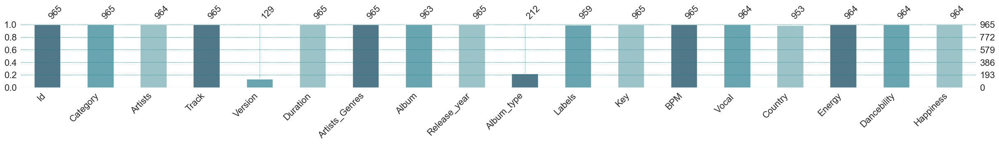

In [154]:
import missingno
missingno.bar(df, color=palette, figsize=(30,2))

There is also a significant lack of data in columns "Version" and "Album_type". I'm going to get rid of these columns.

In [155]:
df.nunique()

Id                965
Category            3
Artists           501
Track             943
Version             5
Duration          936
Artists_Genres    258
Album             699
Release_year       47
Album_type          2
Labels            336
Key                25
BPM               111
Vocal               4
Country            47
Energy             90
Dancebility        81
Happiness          96
dtype: int64

As it can be seen above, all the values of the "Number" column are unique. I'm going to get rid of this column too.

In [156]:
# как вариант можно заполнить пропущенные через .fillna() 

# df["Version"] = df["Version"].fillna("NA")
# df["Album_type"] = df["Album_type"].fillna("NA")

In [157]:
df1 = df.copy()
df1.columns.values

array(['Id', 'Category', 'Artists', 'Track', 'Version', 'Duration',
       'Artists_Genres', 'Album', 'Release_year', 'Album_type', 'Labels',
       'Key', 'BPM', 'Vocal ', 'Country', 'Energy', 'Dancebility',
       'Happiness'], dtype=object)

In [158]:
df1 = df1.drop(['Id', 'Version', 'Album_type'], axis=1)
df1.columns.values

array(['Category', 'Artists', 'Track', 'Duration', 'Artists_Genres',
       'Album', 'Release_year', 'Labels', 'Key', 'BPM', 'Vocal ',
       'Country', 'Energy', 'Dancebility', 'Happiness'], dtype=object)

### Artists

In [159]:
description['Artists']

{'description': 'Artists names', 'values': "String values, separated with '|'"}

In [160]:
df1['Artists'].isnull().sum()

1

In [161]:
df1['Artists'] = df1['Artists'].fillna('NA')

In [162]:
# Screenshot of the report "pp.ProfileReport(df)" shown above in the part of the values of the column "Artists":
#Image(filename='pp_1.jpg', width = 700)

As it can be seen in the report "pp.ProfileReport(df)", some of the artists are mentioned many times. I'm going to divide the artists into groups according to the number of mentions of them in the column. I will apply One hot coding to the resulting groups.

In [163]:
unique, counts = np.unique(df1['Artists'].to_numpy().ravel().tolist(), return_counts=True)
un_artists = pd.DataFrame(np.vstack((unique, counts)).T, columns=['value', 'count'])
un_artists

,value,count
0,104|Скриптонит|Miyagi,1
1,21 Savage,1
2,50 Cent,2
3,50 Cent|Justin Timberlake|Timbaland,1
4,6LACK,1
...,...,...
497,Шура,1
498,Элджей,2
499,Элджей|Era Istrefi,1
500,Элджей|FEDUK,1


In [164]:
dict1 = un_artists.groupby('value')['count'].mean()
dict1

value
104|Скриптонит|Miyagi                  1.0
21 Savage                              1.0
50 Cent                                2.0
50 Cent|Justin Timberlake|Timbaland    1.0
6LACK                                  1.0
                                      ... 
Шура                                   1.0
Элджей                                 2.0
Элджей|Era Istrefi                     1.0
Элджей|FEDUK                           1.0
Элджей|MORGENSHTERN                    1.0
Name: count, Length: 502, dtype: float64

In [165]:
df1['Artists'] = df1['Artists'].map(dict1)
df1['Artists']

0       1.0
1       1.0
2       2.0
3       1.0
4       1.0
       ... 
960     7.0
961    17.0
962     3.0
963     1.0
964     1.0
Name: Artists, Length: 965, dtype: float64

In [166]:
art_dummies = pd.get_dummies(df1['Artists'], drop_first = True)

In [167]:
art_dummies.head(1)

,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,15.0,16.0,17.0,23.0,47.0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [168]:
g1 = art_dummies.loc[:, :5].max(axis=1);
g2 = art_dummies.loc[:, 6:10].max(axis=1);
g3 = art_dummies.loc[:, 11:15].max(axis=1);
g4 = art_dummies.loc[:, 16:].max(axis=1)
df1 = pd.concat([df1, g1, g2, g3, g4], axis=1)
df1.columns.values

array(['Category', 'Artists', 'Track', 'Duration', 'Artists_Genres',
       'Album', 'Release_year', 'Labels', 'Key', 'BPM', 'Vocal ',
       'Country', 'Energy', 'Dancebility', 'Happiness', 0, 1, 2, 3],
      dtype=object)

In [169]:
rename = ['Category', 'Artists', 'Track', 'Duration', 'Artists_Genres',
       'Album', 'Release_year', 'Labels', 'Key', 'BPM', 'Vocal ',
       'Country', 'Energy', 'Dancebility', 'Happiness', 'art_list_2_5', 'art_list_6_10', 'art_list_11_15', 'art_list_more_15']
df1.columns = rename

In [170]:
df1 = df1.drop(['Artists'], axis=1)
df1.head(3)

,Category,Track,Duration,Artists_Genres,Album,Release_year,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,art_list_more_15
0,dislike,Hail the Apocalypse,253660,metal,Hail the Apocalypse,2014,Gain,F# Major,93,M,SWE,99.0,42.0,30.0,0,0,0,0
1,like,My Heart Will Go On,284150,soundtrack|classical|pop,My Love Ultimate Essential Collection,2019,Sony Music Entertainment Canada,E Major,99,F,CA,28.0,43.0,4.0,0,0,0,0
2,like,Skyfall,286480,pop,Skyfall,2012,Melted Stone|Skyfall|Columbia,C Minor,76,F,GB,55.0,35.0,8.0,1,0,0,0


In [171]:
#encoder = LabelEncoder()
#df1['Artists'] = encoder.fit_transform(df1['Artists'])
#df1.head(1)

### Track

In [172]:
df2 = df1.copy()

In [173]:
description['Track']

{'description': 'Track title', 'values': 'String value'}

In [174]:
df2['Track'].isnull().sum()

0

In [175]:
t = df2['Track']
t.nunique()

943

I'm going to use the utility class "Label Encoder" in order to convert categorical variables in the "Track" column into numerical values.

In [176]:
encoder = LabelEncoder()
df2['Track'] = encoder.fit_transform(df2['Track'])
df2.head(1)

,Category,Track,Duration,Artists_Genres,Album,Release_year,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,art_list_more_15
0,dislike,269,253660,metal,Hail the Apocalypse,2014,Gain,F# Major,93,M,SWE,99.0,42.0,30.0,0,0,0,0


### Duration

In [177]:
description['Duration']

{'description': 'Track duration in milliseconds',
 'values': 'Integer value from 0 to inf'}

In [178]:
d = df2['Duration']
d.nunique()

936

In [179]:
df2['Duration'].isnull().sum()

0

I will reduce the dimension of the data in the "Duration" column by 3 digits.

In [180]:
df2["Duration"] = df2["Duration"].apply(lambda x: round(x/1000))

In [181]:
df2.head(1)

,Category,Track,Duration,Artists_Genres,Album,Release_year,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,art_list_more_15
0,dislike,269,254,metal,Hail the Apocalypse,2014,Gain,F# Major,93,M,SWE,99.0,42.0,30.0,0,0,0,0


### Artists_Genres

In [182]:
df3 = df2.copy()

In [183]:
df3.head(1)

,Category,Track,Duration,Artists_Genres,Album,Release_year,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,art_list_more_15
0,dislike,269,254,metal,Hail the Apocalypse,2014,Gain,F# Major,93,M,SWE,99.0,42.0,30.0,0,0,0,0


In [184]:
description['Artists Genres']

{'description': 'The list of ganres for the specified artist (not the current track)',
 'values': "Ganres labels separated by '|'"}

In [185]:
df3['Artists_Genres'].nunique()

258

In [186]:
ganres_onehot = split_to_onehot(df3, "Artists_Genres")
plot_commulative_onehot(ganres_onehot)

I think an approach can be applied here with the assignment of groups by the number of mentions of the Genre. By analogy, as we did with the column "Artists". But instead I'm going to go the other way. To reduce the dimension of the values in the "Artists_Genres" column, I'm going to use the t-SNE (t-distributed stochastic neighbor embedding) algorithm.

In [187]:
from sklearn.manifold import TSNE
import plotly.express as px

In [188]:
def onehot_to_tsne2(df, title):
    onehot = df.drop("Category", axis=1)
    embedding = TSNE(n_components=2, learning_rate='auto', init="random")
    embedded = embedding.fit_transform(onehot)
    embedded = pd.DataFrame(embedded, columns=[f"{title}_tsne1", f"{title}_tsne2"])
    return embedded

In [189]:
genres_onehot = split_to_onehot(df3, "Artists_Genres")
genres_embedded = onehot_to_tsne2(genres_onehot, "Genres")
df3 = pd.concat([df3,genres_embedded], axis=1)

_df = genres_embedded.copy(deep=True)
_df[["Category","Artists_Genres"]] = df3[["Category","Artists_Genres"]]
px.scatter(_df,x="Genres_tsne1",y="Genres_tsne2",color="Category", hover_data=["Artists_Genres"], height=500, color_discrete_sequence=palette)

In [190]:
df3 = df3.drop(['Artists_Genres'], axis=1)
df3.head(1)

,Category,Track,Duration,Album,Release_year,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,art_list_more_15,Genres_tsne1,Genres_tsne2
0,dislike,269,254,Hail the Apocalypse,2014,Gain,F# Major,93,M,SWE,99.0,42.0,30.0,0,0,0,0,-5.948958,-9.13584


### Album

In [202]:
df3_ = df3.copy()

In [203]:
description['Album']

{'description': 'Album title', 'values': 'String value'}

In [204]:
df3_['Album'].isnull().sum()

2

In [205]:
df3_['Album'] = df3_['Album'].fillna('NA')
df3_['Album'].isnull().sum()

0

In [206]:
# Применение функции split_to_onehot для преобразования данных по столбцу 'Album' в one-hot encoding
album_onehot = split_to_onehot(df3_, 'Album')

C:\Anaconda3\envs\tf\lib\site-packages\pandas\core\frame.py:3678: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



In [207]:
album_embedded = onehot_to_tsne2(album_onehot, 'Album')
df3_ = pd.concat([df3_,album_embedded], axis=1)
df3_ = df3_.drop('Album', axis=1)

I'm going to use the utility class "Label Encoder". By analogy, as we did with the column "Track", I will convert categorical variables in the "Albom" column into numerical values.

In [208]:
#album_encoder = LabelEncoder()
#df3['Album'] = album_encoder.fit_transform(df3['Album'])
df3_.head(1)

,Category,Track,Duration,Release_year,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,art_list_more_15,Genres_tsne1,Genres_tsne2,Album_tsne1,Album_tsne2
0,dislike,269,254,2014,Gain,F# Major,93,M,SWE,99.0,42.0,30.0,0,0,0,0,-5.948958,-9.13584,3.888818,-6.976041


###  Release_year

In [209]:
description['Release year']

{'description': 'The year of the albom release', 'values': 'Year number'}

In [210]:
df3_['Release_year'].isnull().sum()

0

I'm going to group the release years by decade and apply One Hot Coding

In [211]:
df3_['Decades'] = 0
for i in df3_.index:
    if df3_['Release_year'][i] in range(2020, 2022):
        df3_.loc[i, 'Decades'] = 2020
    if df3_['Release_year'][i] in range(2010, 2020):
        df3_.loc[i, 'Decades'] = 2010
    if df3_['Release_year'][i] in range(2000, 2010):
        df3_.loc[i, 'Decades'] = 2000
    if df3_['Release_year'][i] in range(1990, 2000):
        df3_.loc[i, 'Decades'] = 1990
    if df3_['Release_year'][i] in range(1990):
        df3_.loc[i, 'Decades'] = 1980

In [212]:
Dec = pd.get_dummies(df3_['Decades'], drop_first = True)
Dec.head(3)

,1990,2000,2010,2020
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0


In [213]:
df3_ = pd.concat([df3_, Dec], axis=1)
df3_.columns.values

array(['Category', 'Track', 'Duration', 'Release_year', 'Labels', 'Key',
       'BPM', 'Vocal ', 'Country', 'Energy', 'Dancebility', 'Happiness',
       'art_list_2_5', 'art_list_6_10', 'art_list_11_15',
       'art_list_more_15', 'Genres_tsne1', 'Genres_tsne2', 'Album_tsne1',
       'Album_tsne2', 'Decades', 1990, 2000, 2010, 2020], dtype=object)

In [214]:
df3_ = df3_.drop(['Release_year', 'Decades'], axis=1)

### Labels

In [215]:
df4 = df3_.copy()
df4.head(3)

,Category,Track,Duration,Labels,Key,BPM,Vocal,Country,Energy,Dancebility,...,art_list_11_15,art_list_more_15,Genres_tsne1,Genres_tsne2,Album_tsne1,Album_tsne2,1990,2000,2010,2020
0,dislike,269,254,Gain,F# Major,93,M,SWE,99.0,42.0,...,0,0,-5.948958,-9.135840,3.888818,-6.976041,0,0,1,0
1,like,468,284,Sony Music Entertainment Canada,E Major,99,F,CA,28.0,43.0,...,0,0,7.269191,6.278735,3.888818,-6.976041,0,0,1,0
2,like,625,286,Melted Stone|Skyfall|Columbia,C Minor,76,F,GB,55.0,35.0,...,0,0,9.474621,2.815904,3.888818,-6.976041,0,0,1,0


In [216]:
description['Labels']

{'description': 'Record labels', 'values': "string value, separated with '|'"}

In [217]:
df4['Labels'].isnull().sum()

6

In [218]:
df4['Labels'] = df4['Labels'].fillna('NA')
df4['Labels'].isnull().sum()

0

In [219]:
unique, counts = np.unique(df4['Labels'].to_numpy().ravel().tolist(), return_counts=True)
un_labels = pd.DataFrame(np.vstack((unique, counts)).T, columns=['value', 'count'])
un_labels

,value,count
0,300 Entertainment|Young Stoner Life,1
1,3Beat,1
2,6IX9INE,5
3,A 222|Interscope Records Release,1
4,A Capitol Records Release,1
...,...,...
332,Союз Мьюзик,7
333,Союз Мьюзик по лицензии Cooking Vinyl,1
334,Сплин,1
335,Студия СОЮЗ,1


In [220]:
un_labels1 = pd.to_numeric(un_labels['count'], errors='coerce')
un_labels = un_labels.drop(['count'], axis = 1)
un_labels = pd.concat([un_labels, un_labels1], axis = 1)

In [221]:
labels_more10 = un_labels[un_labels['count'] > 10]
labels_less10 = un_labels[un_labels['count'] <= 10]
print('Shape labels_more10: ', labels_more10.shape)
print('Shape labels_less10: ', labels_less10.shape)

Shape labels_more10:  (11, 2)
Shape labels_less10:  (326, 2)


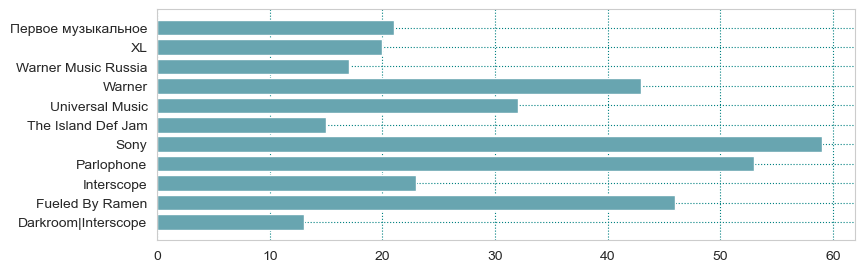

In [222]:
sns.set_style('whitegrid', {'grid.color': 'teal', 'grid.linestyle': ':'})
plt.figure(figsize = (9, 3))
plt.barh(labels_more10["value"], labels_more10["count"], color = '#68a5b0')
plt.show()

I have determined the number of repetitions of labels in the date frame. It can be seen that there are 337 unique values. Of these, 11 occur more than 10 times. I will divide the values of the "Labels" column into 4 groups depending on the number of repetitions and apply One Hot Encoding to them. The division will be carried out as follows: <10 - into 2 groups and >10 into two groups.

In [223]:
dict2 = un_labels.groupby('value')['count'].mean()
dict2

value
300 Entertainment|Young Stoner Life      1.0
3Beat                                    1.0
6IX9INE                                  5.0
A 222|Interscope Records Release         1.0
A Capitol Records Release                1.0
                                        ... 
Союз Мьюзик                              7.0
Союз Мьюзик по лицензии Cooking Vinyl    1.0
Сплин                                    1.0
Студия СОЮЗ                              1.0
Танцевальный рай|Студия СОЮЗ             1.0
Name: count, Length: 337, dtype: float64

In [224]:
df4['Labels'] = df4['Labels'].map(dict2)
df4['Labels']

0       1.0
1       1.0
2       1.0
3      15.0
4       2.0
       ... 
960     7.0
961    53.0
962     4.0
963     1.0
964     2.0
Name: Labels, Length: 965, dtype: float64

In [225]:
label_dummies = pd.get_dummies(df4['Labels'], drop_first = True)
label_dummies.head(1)

,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,13.0,15.0,17.0,20.0,21.0,23.0,32.0,43.0,46.0,53.0,59.0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [226]:
l1 = label_dummies.loc[:, :5].max(axis=1);
l2 = label_dummies.loc[:, 6:10].max(axis=1);
l3 = label_dummies.loc[:, 11:30].max(axis=1);
l4 = label_dummies.loc[:, 31:].max(axis=1)
df4 = pd.concat([df4, l1, l2, l3, l4], axis=1)
df4.columns.values

array(['Category', 'Track', 'Duration', 'Labels', 'Key', 'BPM', 'Vocal ',
       'Country', 'Energy', 'Dancebility', 'Happiness', 'art_list_2_5',
       'art_list_6_10', 'art_list_11_15', 'art_list_more_15',
       'Genres_tsne1', 'Genres_tsne2', 'Album_tsne1', 'Album_tsne2', 1990,
       2000, 2010, 2020, 0, 1, 2, 3], dtype=object)

In [227]:
rename = ['Category', 'Track', 'Duration', 'Labels', 'Key', 'BPM', 'Vocal ',
       'Country', 'Energy', 'Dancebility', 'Happiness', 'art_list_2_5',
       'art_list_6_10', 'art_list_11_15', 'art_list_more_15',
       'Genres_tsne1', 'Genres_tsne2', 'Album_tsne1', 'Album_tsne2', '1990',
       '2000', '2010', '2020', 'label_1_5', 'label_6_10', 'label_11_30', 'label_more_30']
df4.columns = rename

In [228]:
df4 = df4.drop(['Labels'], axis=1)

In [229]:
#encoder = LabelEncoder()
#df4['Labels'] = encoder.fit_transform(df4['Labels'])
#df4.head(1)

In [230]:
#labels_onehot = split_to_onehot(df4, 'Labels')

In [231]:
#labels_embedded = onehot_to_tsne2(labels_onehot, 'Labels')
#df4 = pd.concat([df4,labels_embedded], axis=1)
#df4 = df4.drop('Labels', axis=1)

### Key

In [232]:
df5 = df4.copy()
df5.head(3)

,Category,Track,Duration,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,...,Album_tsne1,Album_tsne2,1990,2000,2010,2020,label_1_5,label_6_10,label_11_30,label_more_30
0,dislike,269,254,F# Major,93,M,SWE,99.0,42.0,30.0,...,3.888818,-6.976041,0,0,1,0,0,0,0,0
1,like,468,284,E Major,99,F,CA,28.0,43.0,4.0,...,3.888818,-6.976041,0,0,1,0,0,0,0,0
2,like,625,286,C Minor,76,F,GB,55.0,35.0,8.0,...,3.888818,-6.976041,0,0,1,0,0,0,0,0


In [233]:
description['Key']

{'description': 'The group of pitches, or scale, that forms the basis of a music composition',
 'values': 'Contains from identifier of the tonic chord from A to G, # or в™\xad, Major or Minor triad'}

In [234]:
df5['Key'].isnull().sum()

0

In [235]:
key_onehot = split_to_onehot(df5, "Key")
plot_commulative_onehot(key_onehot)

As it seen on the histogram, the preference for tracks with the key "C Major" is highlighted. Dislikes are noticeable in Minor compositions "A" and "E". However, the Minor composition "B" gets more Likes.
I make an assumption that the user's preference consists of two components. 1 - tone: Minor or Major. 2 - chord: A, Ab, B, Bb, C, D, Db, E, Eb, G, F, F#.
Hence I'm going to:
- select an additional feature "KeyMajor" in a separate column, where "1" will be a Major and "0" a Minor;

- assign ordinal numbers to the chord in the "Key" column.

I had a consultation with a professional musician regarding the uniqueness specified in the list of values. Information was received that all these features are important from the point of view of the characteristics of the musical work. Therefore, I decided to leave all the values and apply One Hot Coding to them.

In [236]:
df5['KeyMajor'] = df5['Key'].apply(lambda x: x.split(" ")[1])
df5['Key'] = df5['Key'].apply(lambda x: x.split(" ")[0])
df5.head(3)

,Category,Track,Duration,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,...,Album_tsne2,1990,2000,2010,2020,label_1_5,label_6_10,label_11_30,label_more_30,KeyMajor
0,dislike,269,254,F#,93,M,SWE,99.0,42.0,30.0,...,-6.976041,0,0,1,0,0,0,0,0,Major
1,like,468,284,E,99,F,CA,28.0,43.0,4.0,...,-6.976041,0,0,1,0,0,0,0,0,Major
2,like,625,286,C,76,F,GB,55.0,35.0,8.0,...,-6.976041,0,0,1,0,0,0,0,0,Minor


In [237]:
df5.loc[:,'KeyMajor'] = (df5['KeyMajor']=='Major').astype(int)


In [238]:
df5.head(3)

,Category,Track,Duration,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,...,Album_tsne2,1990,2000,2010,2020,label_1_5,label_6_10,label_11_30,label_more_30,KeyMajor
0,dislike,269,254,F#,93,M,SWE,99.0,42.0,30.0,...,-6.976041,0,0,1,0,0,0,0,0,1
1,like,468,284,E,99,F,CA,28.0,43.0,4.0,...,-6.976041,0,0,1,0,0,0,0,0,1
2,like,625,286,C,76,F,GB,55.0,35.0,8.0,...,-6.976041,0,0,1,0,0,0,0,0,0


In [239]:
key_onehot = split_to_onehot(df5, 'Key')
plot_commulative_onehot(key_onehot)

In [240]:
#df5.loc[:,'Key'] = df5['Key'].replace({'A':1, 'A♭':2, 'B':3, 'B♭':4, 'C':5,
#                                       'D':6, 'D♭':7, 'E':8, 'E♭':9, 'G':10,
#                                       'F':11, 'F#':12, 'C#':13})

In [241]:
df5.head(3)

,Category,Track,Duration,Key,BPM,Vocal,Country,Energy,Dancebility,Happiness,...,Album_tsne2,1990,2000,2010,2020,label_1_5,label_6_10,label_11_30,label_more_30,KeyMajor
0,dislike,269,254,F#,93,M,SWE,99.0,42.0,30.0,...,-6.976041,0,0,1,0,0,0,0,0,1
1,like,468,284,E,99,F,CA,28.0,43.0,4.0,...,-6.976041,0,0,1,0,0,0,0,0,1
2,like,625,286,C,76,F,GB,55.0,35.0,8.0,...,-6.976041,0,0,1,0,0,0,0,0,0


In [242]:
key_dummies = pd.get_dummies(df5['Key'], drop_first = True)
key_dummies.head(1)

,A♭,B,B♭,C,C#,D,D♭,E,E♭,F,F#,G
0,0,0,0,0,0,0,0,0,0,0,1,0


In [243]:
df5 = pd.concat([df5, key_dummies], axis=1)
df5.columns.values

array(['Category', 'Track', 'Duration', 'Key', 'BPM', 'Vocal ', 'Country',
       'Energy', 'Dancebility', 'Happiness', 'art_list_2_5',
       'art_list_6_10', 'art_list_11_15', 'art_list_more_15',
       'Genres_tsne1', 'Genres_tsne2', 'Album_tsne1', 'Album_tsne2',
       '1990', '2000', '2010', '2020', 'label_1_5', 'label_6_10',
       'label_11_30', 'label_more_30', 'KeyMajor', 'A♭', 'B', 'B♭', 'C',
       'C#', 'D', 'D♭', 'E', 'E♭', 'F', 'F#', 'G'], dtype=object)

In [244]:
#rename = ['Category', 'Track', 'Duration', 'Key', 'BPM', 'Vocal ', 'Country',
#       'Energy', 'Dancebility', 'Happiness', 'art_list_2_5',
#       'art_list_6_10', 'art_list_11_15', 'art_list_more_15',
#       'Genres_tsne1', 'Genres_tsne2', 'Album_tsne1', 'Album_tsne2',
#       '1990', '2000', '2010', '2020', 'label_1_5', 'label_6_10',
#       'label_11_30', 'label_more_30', 'KeyMajor', 'A♭', 'B', 'B♭', 'C', 'D', 'D♭', 'E', 'E♭', 'G', 'F', 'F#', 'C#']
#df5.columns = rename
df5 = df5.drop(['Key'], axis=1)
df5.head(3)

,Category,Track,Duration,BPM,Vocal,Country,Energy,Dancebility,Happiness,art_list_2_5,...,B♭,C,C#,D,D♭,E,E♭,F,F#,G
0,dislike,269,254,93,M,SWE,99.0,42.0,30.0,0,...,0,0,0,0,0,0,0,0,1,0
1,like,468,284,99,F,CA,28.0,43.0,4.0,0,...,0,0,0,0,0,1,0,0,0,0
2,like,625,286,76,F,GB,55.0,35.0,8.0,1,...,0,1,0,0,0,0,0,0,0,0


### Vocal

In [245]:
df6 = df5.copy()

In [246]:
description['Vocal']

{'description': 'Types of the vocals in the track',
 'values': "Values, separated with '|' (M - male, F- female, N - no vocal)"}

In [247]:
df6['Vocal '].isnull().sum()

1

In [248]:
df6['Vocal '] = df6['Vocal '].fillna('NA')
df6['Vocal '].isnull().sum()

0

In [249]:
v_onehot = np.zeros((len(df6),2))
for i in range(len(df6)):
    v = df6.iloc[i]['Vocal ']
    if v == 'F':
        v_onehot[i] = [1,0]
    elif v == 'M':
        v_onehot[i] = [0,1]
    elif v == 'F|M':
        v_onehot[i] = [1,1]
df6[['F_voc','M_voc']] = v_onehot
df6[['F_voc','M_voc']] = df6[['F_voc','M_voc']].astype(int)

In [250]:
df6 = df6.drop('Vocal ',axis=1)
df6.head(3)

,Category,Track,Duration,BPM,Country,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,...,C#,D,D♭,E,E♭,F,F#,G,F_voc,M_voc
0,dislike,269,254,93,SWE,99.0,42.0,30.0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,like,468,284,99,CA,28.0,43.0,4.0,0,0,...,0,0,0,1,0,0,0,0,1,0
2,like,625,286,76,GB,55.0,35.0,8.0,1,0,...,0,0,0,0,0,0,0,0,1,0


### Country

In [251]:
description['Country']

{'description': 'Codes of countries of production',
 'values': {'AT': 'Austria',
  'AU': 'Australia',
  'BEL': 'Belarus',
  'BAR': 'Barbados',
  'CA': 'Canada',
  'COL': 'Colombia',
  'DE': 'Germany',
  'DK': 'Denmark',
  'FIN': 'Finland',
  'FR': 'France',
  'IRL': 'Ireland',
  'ITL': 'Italy',
  'JM': 'Jamaica',
  'KZ': 'Kazakhstan',
  'KR': 'South Korea',
  False: 'Norway',
  'NED': 'Netherlands',
  'POR': 'Portugal',
  'RUS': 'Russia',
  'SWE': 'Sweden',
  'UA': 'Ukraine',
  'JP': 'Japan',
  'TR': 'Trinidad',
  'AZE': 'Azerbaijan',
  'GB': 'Great Britain',
  'NA': 'Not available',
  'USA': 'USA'}}

In [252]:
df6['Country'].isnull().sum()

12

In [253]:
df6['Country'] = df6['Country'].fillna('NA')
df6['Country'].isnull().sum()

0

In [254]:
country_onehot = split_to_onehot(df6, 'Country')
country_onehot

,Category,FR,SWE,COL,UA,KR,BAR,DK,KZ,JM,GB,RUS,CA,NA,USA,AU
0,dislike,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,like,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,like,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,like,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,dislike,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
960,none,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
961,none,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
962,none,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
963,none,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [255]:
country_onehot = country_onehot.drop('Category', axis=1)
df6 = pd.concat([df6,country_onehot], axis=1)
df6 = df6.drop('Country', axis=1)

As I did it with "Track" column, I'm going to use the utility class "Label Encoder" in order to convert categorical variables in the "Country" column into numerical values.

In [256]:
#df6['Country'] = encoder.fit_transform(df6['Country'])
df6.head(3)

,Category,Track,Duration,BPM,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,...,BAR,DK,KZ,JM,GB,RUS,CA,NA,USA,AU
0,dislike,269,254,93,99.0,42.0,30.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,like,468,284,99,28.0,43.0,4.0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,like,625,286,76,55.0,35.0,8.0,1,0,0,...,0,0,0,0,1,0,0,0,0,0


### BPM, Energy, Dancebility, Happiness

In [257]:
df7 = df6.copy()

In [258]:
for i in ['BPM','Energy', 'Dancebility', 'Happiness']:
    print(f'{i}:{description[i]}')

BPM:{'description': 'Beats-Per-Minute - the measure of tempo', 'values': 'integer value from 0 to inf'}
Energy:{'description': 'Continuouse value, describing energy of the track', 'values': '0-100'}
Dancebility:{'description': 'Continuouse value, describing dancebility of the track', 'values': '0-100'}
Happiness:{'description': 'Continuouse value, describing happiness of the track', 'values': '0-100'}


In [259]:
df7.loc[:, ['BPM','Energy', 'Dancebility', 'Happiness']].describe()

,BPM,Energy,Dancebility,Happiness
count,965.000000,964.000000,964.000000,964.000000
mean,117.537824,68.751037,63.454357,50.268672
std,25.801064,19.162589,16.420202,23.482333
min,49.000000,2.000000,15.000000,4.000000
25%,97.000000,56.000000,52.750000,32.000000
50%,117.000000,71.000000,65.000000,51.000000
75%,135.000000,83.000000,76.000000,68.000000
max,176.000000,100.000000,97.000000,99.000000


These features look acceptable. I'm going to leave them unchanged.

In [260]:
df7.loc[:, ['BPM','Energy', 'Dancebility', 'Happiness']].isnull().sum()

BPM            0
Energy         1
Dancebility    1
Happiness      1
dtype: int64

In [261]:
df7['Energy'] = df7['Energy'].fillna(0)
df7['Dancebility'] = df7['Dancebility'].fillna('0')
df7['Happiness'] = df7['Happiness'].fillna('0')
df7.loc[:, ['BPM','Energy', 'Dancebility', 'Happiness']].isnull().sum()

BPM            0
Energy         0
Dancebility    0
Happiness      0
dtype: int64

In [262]:
df7.loc[:, ['BPM','Energy', 'Dancebility', 'Happiness']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 965 entries, 0 to 964
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   BPM          965 non-null    int64  
 1   Energy       965 non-null    float64
 2   Dancebility  965 non-null    object 
 3   Happiness    965 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 30.3+ KB


In [263]:
df7.loc[:, ['Energy', 'Dancebility', 'Happiness']] = df7.loc[:, ['Energy', 'Dancebility', 'Happiness']].astype('float')

## Creating models.

In [264]:
# Создание копии DataFrame df7 для дальнейших манипуляций
df_final = df7.copy()
df_final.head(3)

,Category,Track,Duration,BPM,Energy,Dancebility,Happiness,art_list_2_5,art_list_6_10,art_list_11_15,...,BAR,DK,KZ,JM,GB,RUS,CA,NA,USA,AU
0,dislike,269,254,93,99.0,42.0,30.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,like,468,284,99,28.0,43.0,4.0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,like,625,286,76,55.0,35.0,8.0,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [265]:
# разделим данные на признаки (x) и целевую переменную (y) для тренировочного набора
x, y = df_final.loc[tr_mask].iloc[:,1:], df_final.loc[tr_mask,'Category']
# выбор данных для развёртывания (предсказание на тестовом наборе)
deploy = df_final.loc[~tr_mask].iloc[:,1:]

In [266]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV,ShuffleSplit
from sklearn.ensemble import VotingClassifier

Let's prepare several classification models:
- Decision Tree.
- Random Forest (ensemble method).
- Support Vector Machine.
- K-Nearest Neighbors.
- Logistic Regression.
- CatBoost (gradient boosting optimized for categorical features).

In [267]:
# Импорт классификаторов из различных библиотек машинного обучения
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier

# для настройки гиперпараметров и перекрёстной проверки
from sklearn.model_selection import GridSearchCV, ShuffleSplit   # GridSearchCV для подбора параметров, ShuffleSplit для случайного разбиения данных

# для создания ансамбля моделей на основе голосования
from sklearn.ensemble import VotingClassifier

### DecisionTree Classifier

In [268]:
# Инициализация модели дерева решений
model_d = DecisionTreeClassifier(random_state=42)

# Определение параметров для подбора гиперпараметров:
grid = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4]}

# Создание объекта ShuffleSplit для перекрёстной проверки:
cv = ShuffleSplit(n_splits=5, random_state=0)

# Создание объекта GridSearchCV для подбора наилучших гиперпараметров:
clf = GridSearchCV(model_d, grid, cv=cv, n_jobs=-1)

# Обучение модели
clf.fit(x, y)


GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=0, test_size=None, train_size=None),
             estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                            13, 14, 15, 16, 17, 18, 19, 20, 21,
                                            22, 23, 24, 25, 26, 27, 28, 29, 30,
                                            31, ...],
                         'min_samples_split': [2, 3, 4]})

In [115]:
model_d=clf.best_estimator_
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model_d.predict(deploy)
sample['Category'] = (sample['Category']=='like').astype(int)

In [116]:
sample.to_csv('DecisionTree.csv', index=False)

### RandomForestClassifier

In [117]:
max_depth=[2, 8, 16]
n_estimators = [64, 128, 256]
param_grid = dict(max_depth=max_depth, n_estimators=n_estimators)

model_r = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth)
cv = ShuffleSplit(n_splits=5,random_state=0) 
clf = GridSearchCV(estimator=model_r, param_grid=param_grid, cv = cv)
clf = clf.fit(x, y)

In [118]:
model_r = clf.best_estimator_
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model_r.predict(deploy)
sample['Category'] = (sample['Category']=='like').astype(int)

In [119]:
sample.to_csv('RandomForest.csv', index=False)

In [120]:
d = pd.read_csv('RandomForest.csv')
d

,Id,Category
0,665,0
1,666,1
2,667,1
3,668,0
4,669,0
...,...,...
295,960,0
296,961,1
297,962,1
298,963,1


### SVM Classifier

In [136]:
model_s = SVC()
grid = {'kernel' : ['poly', 'rbf','linear'],
        'C' : [.1,1]}
cv = ShuffleSplit(n_splits=5,random_state=0) 
clf = GridSearchCV(model_s, grid, cv=cv)
clf.fit(x,y)

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=0, test_size=None, train_size=None),
             estimator=SVC(),
             param_grid={'C': [0.1, 1], 'kernel': ['poly', 'rbf', 'linear']})

In [122]:
model_s=clf.best_estimator_
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model_s.predict(deploy)
sample['Category'] = (sample['Category']=='like').astype(int)

In [123]:
sample.to_csv('SVM.csv', index=False)

### KNeighbors Classifier

In [124]:
model_k = KNeighborsClassifier()
k_range = list(range(1, 31))
grid = dict(n_neighbors=k_range)
cv = ShuffleSplit(n_splits=5,random_state=0) 
clf = GridSearchCV(model_k, grid, cv=cv, n_jobs=-1)
clf.fit(x,y)

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=0, test_size=None, train_size=None),
             estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30]})

In [125]:
model_k=clf.best_estimator_
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model_k.predict(deploy)
sample['Category'] = (sample['Category']=='like').astype(int)

In [126]:
sample.to_csv('kneighbours.csv', index=False)

### Logistic Regression

In [127]:
model_l = LogisticRegression(penalty='elasticnet',solver='saga',max_iter=9000)
grid = {"l1_ratio" : [0,.05,.1,]}
cv = ShuffleSplit(n_splits=5,random_state=0) 
clf = GridSearchCV(model_l, grid, cv=cv)
clf.fit(x,y)

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=0, test_size=None, train_size=None),
             estimator=LogisticRegression(max_iter=9000, penalty='elasticnet',
                                          solver='saga'),
             param_grid={'l1_ratio': [0, 0.05, 0.1]})

In [128]:
model_l=clf.best_estimator_
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model_l.predict(deploy)
sample['Category'] = (sample['Category']=='like').astype(int)

In [129]:
sample.to_csv('Logistic.csv', index=False)

### CatBoostClassifier

In [130]:
model_c = CatBoostClassifier(verbose=False)
grid = {'l2_leaf_reg' : [2.5,2.7,3],
        'random_strength' : [0.8, 0.9, 1],
        'learning_rate' : [0.0085, 0.00855, 0.086],
        'depth' : [6]}
cv = ShuffleSplit(n_splits=5,random_state=0) 
clf = GridSearchCV(model_c, grid, cv=cv)
clf.fit(x,y)

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=0, test_size=None, train_size=None),
             estimator=<catboost.core.CatBoostClassifier object at 0x000001D3802954C8>,
             param_grid={'depth': [6], 'l2_leaf_reg': [2.5, 2.7, 3],
                         'learning_rate': [0.0085, 0.00855, 0.086],
                         'random_strength': [0.8, 0.9, 1]})

In [131]:
model_c=clf.best_estimator_
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model_c.predict(deploy)
sample['Category'] = (sample['Category']=='like').astype(int)

In [132]:
sample.to_csv('CatBoost.csv', index=False)

### Voting Classifier for best parameters

In [133]:
model = VotingClassifier(voting='hard',estimators=[
    ('tree', model_d),
    ('forest', model_r),
    ('svm', model_s),
    ('knn', model_k),
    ('log', model_l),
    ('cat', model_c), 
])
model.fit(x,y)

VotingClassifier(estimators=[('tree',
                              DecisionTreeClassifier(max_leaf_nodes=16,
                                                     random_state=42)),
                             ('forest',
                              RandomForestClassifier(max_depth=8,
                                                     n_estimators=256)),
                             ('svm', SVC(C=0.1, kernel='linear')),
                             ('knn', KNeighborsClassifier(n_neighbors=21)),
                             ('log',
                              LogisticRegression(l1_ratio=0, max_iter=9000,
                                                 penalty='elasticnet',
                                                 solver='saga')),
                             ('cat',
                              <catboost.core.CatBoostClassifier object at 0x000001D380319688>)])

In [134]:
sample = pd.read_csv('sample_submition.csv')
sample['Category'] = model.predict(deploy)
sample['Category'] = (sample['Category']=="like").astype(int)

In [135]:
sample.to_csv('Voting.csv', index=False)

# The results of the project.

**Summary of Work:**

- A full machine learning cycle was completed, starting from data preparation and ending with model training.
- Predictions were generated and uploaded to the Kaggle platform ([link](https://www.kaggle.com/code/sanbeimailru/musicpreferments-ivanko)).

**Final Public Score:**
0.66666, indicating a correct classification rate of 66.67% on the test dataset.

**Performance Analysis:**

The model correctly classifies approximately 66.67% of cases in the test set. This result can be considered average.

**Recommendations for Model Improvement:**

- Conduct further data analysis to enhance feature engineering (e.g., creating new features or using PCA for dimensionality reduction).


> **Краткий итог работы:**
>
> - проведен полный цикл машинного обучения, начиная с подготовки данных и заканчивая обучением модели.
> - Сформированы предсказания и загружены на платформу Kaggle ([link](https://www.kaggle.com/code/sanbeimailru/musicpreferments-ivanko)).
> 
> **Итоговый Public Score:**
> 0.66666, что говорит о правильной классификации в 66.67% случаев на тестовом наборе.
> 
> **Анализ эффективности:**
> 
> Модель правильно классифицирует примерно 66.67% случаев в тестовом наборе. Этот показатель может быть рассмотрен как средний.
> 
> **Рекомендации по улучшению модели:**
> 
> - Провести дальнейший анализ данных для улучшения feature engineering (например, создание новых признаков или использование PCA для снижения размерности).